# Potential Areas Modeling

In order to identify suitable areas for Urban Agriculture a unsupervised learning appraoch will be used. Feature Engineering was done and suitabiltiy scores calculated. The suitability scores will be used for clustering. 

## Methodology
- Suitablility for Urban Agriculture is split into three categories:
    - Environmental Suitability
    - Land Use Suitability
    - Amenities
- Suitability scores are calculated 
- Data set split into zones: zone 4 and zone 9
- Clustering is done, DBScan and K-means: Since DBSCAN is computationally expensive a sample of data will be taken. DBSCAN and Kmeans will be done on the sample and compared. Based on results K-means does give similar results to DBSCAn (with certain parameters (around 2 clusters)). Since K-means is less computationally expensive it will  be used for clustering zone 4 and zone 9. K means was done with parameter n_clusters set to 2, areas that may be suitable and areas that are not. This parameter could be tuned and changed upon further iterations to imporove clustering performance. 
- Clusters mapped to static map. 
- Clusteres were also mapped with folium, to verify. This however greatly increased memory size, so outputs were cleared. 

## Data Dictionary 
| #  | Column                                 | Dtype   | Description |
|----|----------------------------------------|---------|-------------|
| 0  | soil_moisture                          | float64 | Soil moisture content (%) |
| 1  | NDBI                                   | float64 | Normalized Difference Built-up Index (range: -1 to 1) |
| 2  | Roughness                              | float64 | Surface roughness (unitless) |
| 3  | Slope                                  | float64 | Slope of the terrain (degrees) |
| 4  | NDVI                                   | float64 | Normalized Difference Vegetation Index (range: -1 to 1) |
| 5  | LST                                    | float64 | Land Surface Temperature (°C) |
| 6  | UHI                                    | float64 | Urban Heat Island effect (°C) |
| 7  | UTFVI                                  | float64 | Urban Thermal Field Variance Index (unitless) |
| 8  | NDWI                                   | float64 | Normalized Difference Water Index (range: -1 to 1) |
| 9  | SAVI                                   | float64 | Soil Adjusted Vegetation Index (range: -1 to 1) |
| 10 | lulc_classes                           | int64   | Land use/land cover classification code |
| 11 | Amenity                                | object  | Type of amenity (e.g., Water Point, Market) |
| 12 | GHI (kWh/m2)                           | float64 | Global Horizontal Irradiance (kWh/m²) |
| 13 | CH4_column_volume_mixing_ratio_dry_air | float64 | Column volume mixing ratio of methane (CH4) in dry air (ppbv) |
| 14 | CO_column_number_density               | float64 | Column number density of carbon monoxide (CO) (molecules/cm²) |
| 15 | tropospheric_HCHO_column_number_density| float64 | Tropospheric column number density of formaldehyde (HCHO) (molecules/cm²) |
| 16 | NO2_column_number_density              | float64 | Column number density of nitrogen dioxide (NO2) (molecules/cm²) |
| 17 | O3_column_number_density               | float64 | Column number density of ozone (O3) (molecules/cm²) |
| 18 | SO2_column_number_density              | float64 | Column number density of sulfur dioxide (SO2) (molecules/cm²) |
| 19 | Longitude                              | float64 | Longitude coordinate of the location |
| 20 | Latitude                               | float64 | Latitude coordinate of the location |
| 21 | cover                                  | object  | Description of land cover |
| 22 | Landuse                                | object  | Description of land use |
| 23 | Typology                               | object  | Typology of the area |
| 24 | Year                                   | int64   | Year of data collection |
| 25 | env_suitability_score                  | float64 | Environmental suitability score |
| 26 | lulc_class_labels                      | object  | Labels for land use/land cover classes |
| 27 | land_suitability_score                 | int64   | Land use suitability score (binary) |


In [63]:
#imports
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

from sklearn.preprocessing import StandardScaler, OneHotEncoder
from sklearn.cluster import DBSCAN
from sklearn.metrics import silhouette_score
from sklearn.preprocessing import MinMaxScaler

In [64]:
df = pd.read_csv('/Users/kamiasalango/Desktop/Milan_Data_Urban_Ag/urban_agriculture_suitability.csv')

/var/folders/h5/pnqm5hvd2vj1397_ck_gmtj00000gn/T/ipykernel_58212/3677957498.py:1: DtypeWarning: Columns (26) have mixed types. Specify dtype option on import or set low_memory=False.
  df = pd.read_csv('/Users/kamiasalango/Desktop/Milan_Data_Urban_Ag/urban_agriculture_suitability.csv')


In [65]:
col_to_drop = ['Descriptio', 'n', 'distance', 'feature_x', 'feature_y', 'nearest_x', 'nearest_y', 'label', 'BU']

df = df.drop(col_to_drop, axis=1)

In [4]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1739219 entries, 0 to 1739218
Data columns (total 28 columns):
 #   Column                                   Dtype  
---  ------                                   -----  
 0   soil_moisture                            float64
 1   NDBI                                     float64
 2   Roughness                                float64
 3   Slope                                    float64
 4   NDVI                                     float64
 5   LST                                      float64
 6   UHI                                      float64
 7   UTFVI                                    float64
 8   NDWI                                     float64
 9   SAVI                                     float64
 10  lulc_classes                             int64  
 11  Amenity                                  object 
 12  GHI (kWh/m2)                             float64
 13  CH4_column_volume_mixing_ratio_dry_air   float64
 14  CO_column_number_d

In [32]:
df.isnull().sum()

soil_moisture                              0
NDBI                                       0
Roughness                                  0
Slope                                      0
NDVI                                       0
LST                                        0
UHI                                        0
UTFVI                                      0
NDWI                                       0
SAVI                                       0
lulc_classes                               0
Amenity                                    0
GHI (kWh/m2)                               0
CH4_column_volume_mixing_ratio_dry_air     0
CO_column_number_density                   0
tropospheric_HCHO_column_number_density    0
NO2_column_number_density                  0
O3_column_number_density                   0
SO2_column_number_density                  0
Longitude                                  0
Latitude                                   0
cover                                      0
Landuse   

**Amenity Score** 


An amenity score will be calculated and used as a feature in clustering. 
Amenity score calculate: 
- Group amenities into categories
- Assign weights to categories, based on importance to urban agriculture (can be changed)
- One hot encode amenities
- Calculate score across row, normalize scores
- Weight scores to get final amenity suitability score

In [5]:
df['Amenity'].unique()

array(['car_wash', 'fuel', 'restaurant', 'waste_basket', 'parking_space',
       'bicycle_parking', 'fast_food', 'pub', 'cafe', 'post_box', 'bench',
       'stripclub', 'vending_machine', 'parking', 'drinking_water',
       'parking_entrance', 'toilets', 'bar', 'social_centre', 'doctors',
       'atm', 'dentist', 'pharmacy', 'ice_cream', 'scooter_sharing',
       'nightclub', 'telephone', 'photo_booth', 'taxi', 'recycling',
       'ticket_validator', 'charging_station', 'lounge', 'police',
       'community_centre', 'kindergarten', 'bank', 'bicycle_rental',
       'social_facility', 'bicycle_repair_station', 'driving_school',
       'clock', 'post_office', 'animal_shelter', 'waste_disposal',
       'library', 'theatre', 'shelter', 'college', 'parcel_locker',
       'animal_boarding', 'townhall', 'school', 'childcare', 'car_rental',
       'fountain', 'cinema', 'veterinary', 'motorcycle_parking',
       'arts_centre', 'clinic', 'hospital', 'dormitory', 'gambling',
       'public_bookcas

In [10]:
(df['Amenity']== 'Unknown').sum()

7310

In [6]:
df.shape

(1739219, 28)

In [4]:
df_amenity = df['Amenity']

In [5]:
df_amenity.head(2)

0    car_wash
1    car_wash
Name: Amenity, dtype: object

In [6]:

df_amenity_encoded = pd.get_dummies(df_amenity, columns=['Amenity'])

In [9]:
df_amenity_encoded.head(1)

,Unknown,animal_boarding,animal_shelter,arts_centre,atm,bank,bar,bench,bicycle_parking,bicycle_rental,...,theatre,ticket_validator,toilets,townhall,training,vending_machine,veterinary,waste_basket,waste_disposal,water_point
0,False,False,False,False,False,False,False,False,False,False,...,False,False,False,False,False,False,False,False,False,False


In [67]:
#define categories for amenities
categories = {
    'Water Sources': ['drinking_water', 'water_point', 'fountain'],
    'Community Facilities': [
        'community_centre', 'library', 'school', 'college', 'social_centre',
        'clinic', 'hospital', 'public_bookcase', 'townhall', 'childcare',
        'place_of_worship', 'social_facility', 'music_school', 'training', 'language_school', 'shelter'
    ],
    'Parking': [
        'parking', 'parking_space', 'bicycle_parking', 'motorcycle_parking',
        'car_rental', 'car_sharing', 'bicycle_rental', 'bicycle_repair_station',
        'scooter_sharing', 'charging_station', 'rv_storage'
    ],
    'Market': [
        'marketplace', 'vending_machine', 'restaurant', 'cafe',
        'bar', 'pub', 'ice_cream'
    ]
}

In [68]:
#define weights for categories
category_weights = {
    'Water Sources': 0.5,
    'Community Facilities': 0.2,
    'Parking': 0.1,
    'Market': 0.2
}


In [15]:
df_amenity_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1739219 entries, 0 to 1739218
Data columns (total 81 columns):
 #   Column                  Dtype
---  ------                  -----
 0   Unknown                 bool 
 1   animal_boarding         bool 
 2   animal_shelter          bool 
 3   arts_centre             bool 
 4   atm                     bool 
 5   bank                    bool 
 6   bar                     bool 
 7   bench                   bool 
 8   bicycle_parking         bool 
 9   bicycle_rental          bool 
 10  bicycle_repair_station  bool 
 11  cafe                    bool 
 12  car_rental              bool 
 13  car_sharing             bool 
 14  car_wash                bool 
 15  charging_station        bool 
 16  childcare               bool 
 17  cinema                  bool 
 18  clinic                  bool 
 19  clock                   bool 
 20  college                 bool 
 21  community_centre        bool 
 22  compressed_air          bool 
 23  confere

In [69]:
#calculate category scores
for category, amenities in categories.items():
    df_amenity_encoded[category + '_score'] = df_amenity_encoded[amenities].sum(axis=1)

In [11]:
df_amenity_encoded.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1739219 entries, 0 to 1739218
Data columns (total 85 columns):
 #   Column                      Dtype
---  ------                      -----
 0   Unknown                     bool 
 1   animal_boarding             bool 
 2   animal_shelter              bool 
 3   arts_centre                 bool 
 4   atm                         bool 
 5   bank                        bool 
 6   bar                         bool 
 7   bench                       bool 
 8   bicycle_parking             bool 
 9   bicycle_rental              bool 
 10  bicycle_repair_station      bool 
 11  cafe                        bool 
 12  car_rental                  bool 
 13  car_sharing                 bool 
 14  car_wash                    bool 
 15  charging_station            bool 
 16  childcare                   bool 
 17  cinema                      bool 
 18  clinic                      bool 
 19  clock                       bool 
 20  college                 

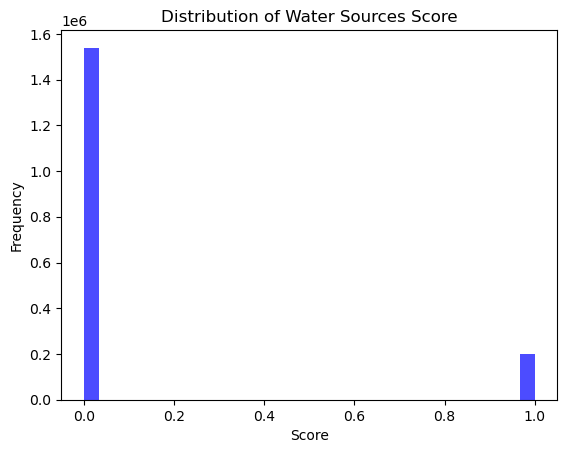

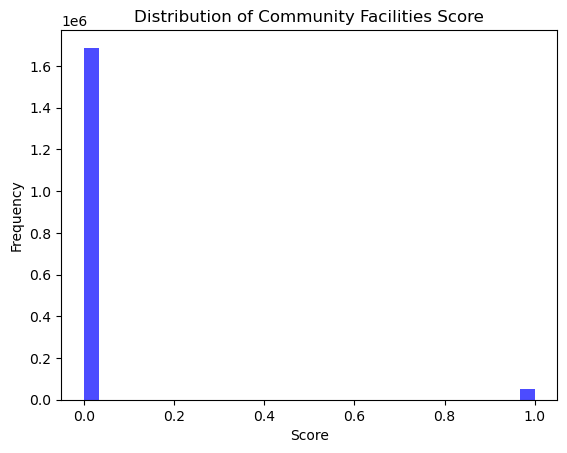

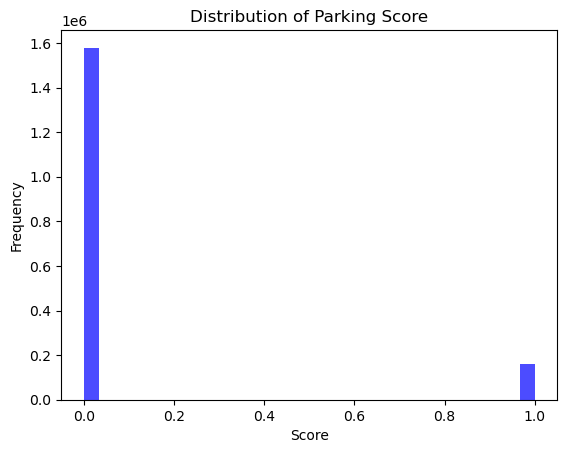

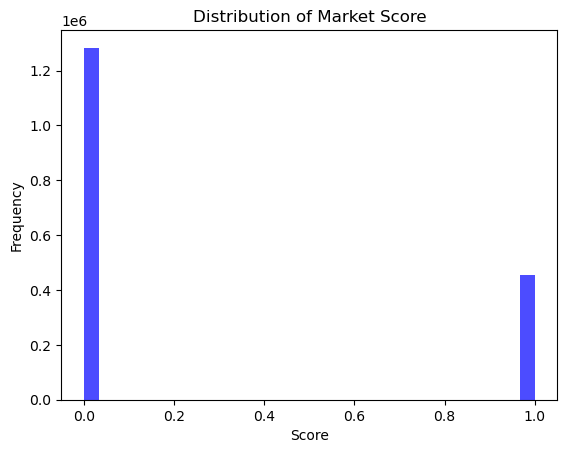

In [12]:
for category in categories.keys():
    plt.figure()
    plt.hist(df_amenity_encoded[category + '_score'], bins=30, alpha=0.7, color='blue')
    plt.title(f'Distribution of {category} Score')
    plt.xlabel('Score')
    plt.ylabel('Frequency')
    plt.show()

In [70]:
#normalize scores
scaler = MinMaxScaler()
category_scores = df_amenity_encoded[[category + '_score' for category in categories.keys()]]
df_amenity_encoded[[category + '_score' for category in categories.keys()]] = scaler.fit_transform(category_scores)


In [71]:
#calculate amenity suitability score 
df_amenity_encoded['amenity_suitability_score'] = df_amenity_encoded.apply(
    lambda row: sum(row[category + '_score'] * weight for category, weight in category_weights.items()), axis=1
)


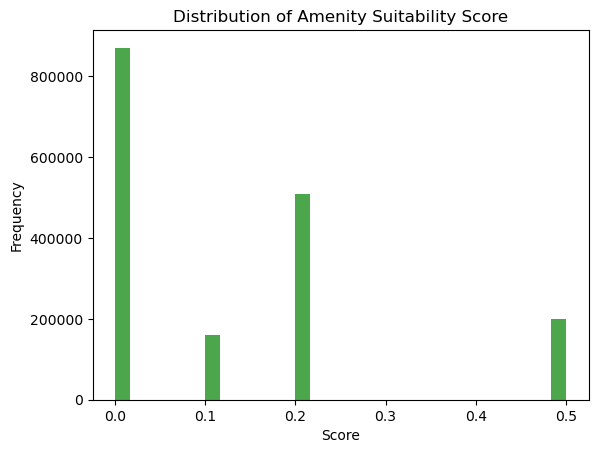

In [15]:
#distribution of suitability score
plt.figure()
plt.hist(df_amenity_encoded['amenity_suitability_score'], bins=30, alpha=0.7, color='green')
plt.title('Distribution of Amenity Suitability Score')
plt.xlabel('Score')
plt.ylabel('Frequency')
plt.show()


In [72]:
amenity_scores_df = df_amenity_encoded[['amenity_suitability_score']]



In [27]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1739219 entries, 0 to 1739218
Data columns (total 28 columns):
 #   Column                                   Dtype  
---  ------                                   -----  
 0   soil_moisture                            float64
 1   NDBI                                     float64
 2   Roughness                                float64
 3   Slope                                    float64
 4   NDVI                                     float64
 5   LST                                      float64
 6   UHI                                      float64
 7   UTFVI                                    float64
 8   NDWI                                     float64
 9   SAVI                                     float64
 10  lulc_classes                             int64  
 11  Amenity                                  object 
 12  GHI (kWh/m2)                             float64
 13  CH4_column_volume_mixing_ratio_dry_air   float64
 14  CO_column_number_d

In [19]:
df.shape[0] == df_amenity_encoded.shape[0]
  

True

In [73]:
#concat amenity suitabiltiy score to original df
final_df = pd.concat([df, df_amenity_encoded[['amenity_suitability_score']]], axis=1)

In [21]:
final_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1739219 entries, 0 to 1739218
Data columns (total 29 columns):
 #   Column                                   Dtype  
---  ------                                   -----  
 0   soil_moisture                            float64
 1   NDBI                                     float64
 2   Roughness                                float64
 3   Slope                                    float64
 4   NDVI                                     float64
 5   LST                                      float64
 6   UHI                                      float64
 7   UTFVI                                    float64
 8   NDWI                                     float64
 9   SAVI                                     float64
 10  lulc_classes                             int64  
 11  Amenity                                  object 
 12  GHI (kWh/m2)                             float64
 13  CH4_column_volume_mixing_ratio_dry_air   float64
 14  CO_column_number_d

 ## Modelling

 [describe modeling process]

**Split into Zones**

In [22]:
#split data into zones
#find largest latitude gap
final_df['latitude_diff'] = final_df['Latitude'].diff().abs()

#identify the index of the largest gap
max_gap_index = final_df['latitude_diff'].idxmax()
max_gap_value = final_df.loc[max_gap_index, 'Latitude']
print(f"Largest gap in latitude is at index {max_gap_index} with latitude {max_gap_value}")


Largest gap in latitude is at index 941385 with latitude 45.48035536


In [74]:
#split into zone 4 and zone 9 using gap as threshold
zone_threshold = 45.48025536 #adjusted threshold 
zone_4 = final_df[final_df['Latitude'] <= zone_threshold]
zone_9 = final_df[final_df['Latitude'] > zone_threshold]

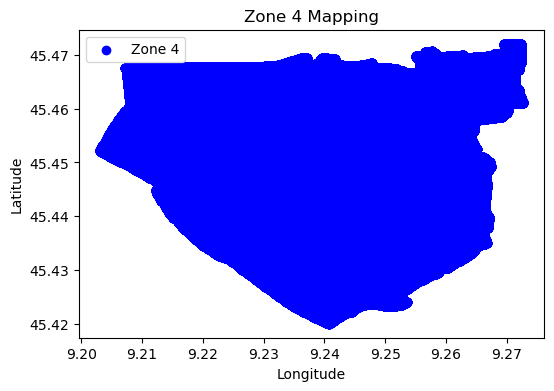

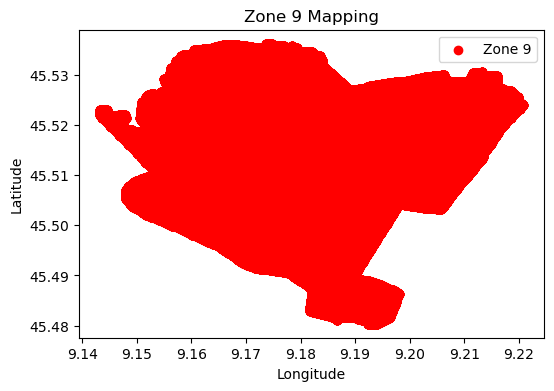

In [24]:
# Plot Zone 4
plt.figure(figsize=(6, 4))
plt.scatter(zone_4['Longitude'], zone_4['Latitude'], c='blue', marker='o', label='Zone 4')
plt.title('Zone 4 Mapping')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

# Plot Zone 9
plt.figure(figsize=(6, 4))
plt.scatter(zone_9['Longitude'], zone_9['Latitude'], c='red', marker='o', label='Zone 9')
plt.title('Zone 9 Mapping')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

In [47]:
zone_4.shape

(868909, 30)

In [48]:
zone_9.shape

(870310, 30)

In [61]:
#range of lon and lat in zone 4
longitude_min, longitude_max = zone_4['Longitude'].min(), zone_4['Longitude'].max()
latitude_min, latitude_max = zone_4['Latitude'].min(), zone_4['Latitude'].max()

print(f"Longitude range for zone_4: {longitude_min} to {longitude_max}")
print(f"Latitude range for zone_4: {latitude_min} to {latitude_max}")

Longitude range for zone_4: 9.20315025427608 to 9.27267985726694
Latitude range for zone_4: 45.4199885749523 to 45.4720908614313


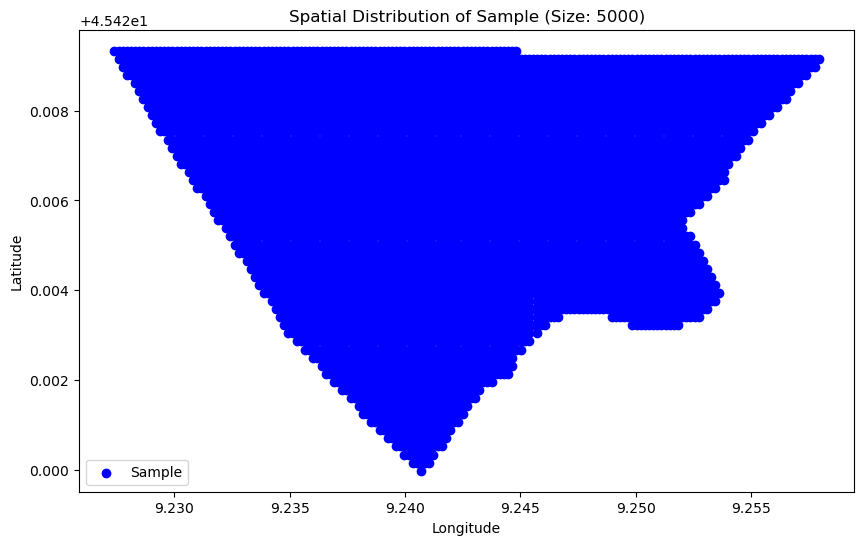

(5000, 29)


In [75]:
sample_size = 5000
zone_4_sample = zone_4.iloc[:sample_size]

# Plot the sample
plt.figure(figsize=(10, 6))
plt.scatter(zone_4_sample['Longitude'], zone_4_sample['Latitude'], c='blue', marker='o', label='Sample')
plt.title(f'Spatial Distribution of Sample (Size: {sample_size})')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.legend()
plt.show()

# Print the sample to verify the data (optional)
print(zone_4_sample.shape)

In [70]:
zone_4_sample.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 0 to 4999
Data columns (total 32 columns):
 #   Column                                   Non-Null Count  Dtype  
---  ------                                   --------------  -----  
 0   soil_moisture                            5000 non-null   float64
 1   NDBI                                     5000 non-null   float64
 2   Roughness                                5000 non-null   float64
 3   Slope                                    5000 non-null   float64
 4   NDVI                                     5000 non-null   float64
 5   LST                                      5000 non-null   float64
 6   UHI                                      5000 non-null   float64
 7   UTFVI                                    5000 non-null   float64
 8   NDWI                                     5000 non-null   float64
 9   SAVI                                     5000 non-null   float64
 10  lulc_classes                             5000 non-nul

In [76]:
zone4_sample = zone_4_sample[['Longitude','Latitude','env_suitability_score', 
                              'amenity_suitability_score', 'land_suitability_score']]

In [27]:
zone4_sample.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 0 to 4999
Data columns (total 5 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Longitude                  5000 non-null   float64
 1   Latitude                   5000 non-null   float64
 2   env_suitability_score      5000 non-null   float64
 3   amenity_suitability_score  5000 non-null   float64
 4   land_suitability_score     5000 non-null   int64  
dtypes: float64(4), int64(1)
memory usage: 234.4 KB


In [77]:
features4 = zone_4_sample[['env_suitability_score', 'amenity_suitability_score', 'land_suitability_score']]


### DBSCAN and K-means for Comparison

- Perform DBSCAN and K-Means on sample and compare results
- DBSCAN Hyperparameters: 
    - min_samples will be set by dimensionality +1, since there are 3 variables min_samples will be set to 4. 
    - epsilon range will be greater than zero but less than sqrt 3 based on Euclidean distance. For sample epsilom around 0.5 will be tried. 


In [74]:
features4.head(10)

,env_suitability_score,amenity_suitability_score,land_suitability_score
0,0.55,0.0,1
1,0.55,0.0,0
2,0.55,0.0,1
3,0.55,0.0,1
4,0.55,0.0,1
5,0.55,0.0,1
6,0.55,0.0,0
7,0.55,0.0,0
8,0.55,0.0,0
9,0.55,0.0,1


In [80]:
#DBSCAN 
dbscan = DBSCAN(eps=0.1, min_samples=10)  
zone4_sample['dbscan_cluster'] = dbscan.fit_predict(features4)

/var/folders/h5/pnqm5hvd2vj1397_ck_gmtj00000gn/T/ipykernel_58212/1535977436.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone4_sample['dbscan_cluster'] = dbscan.fit_predict(features4)


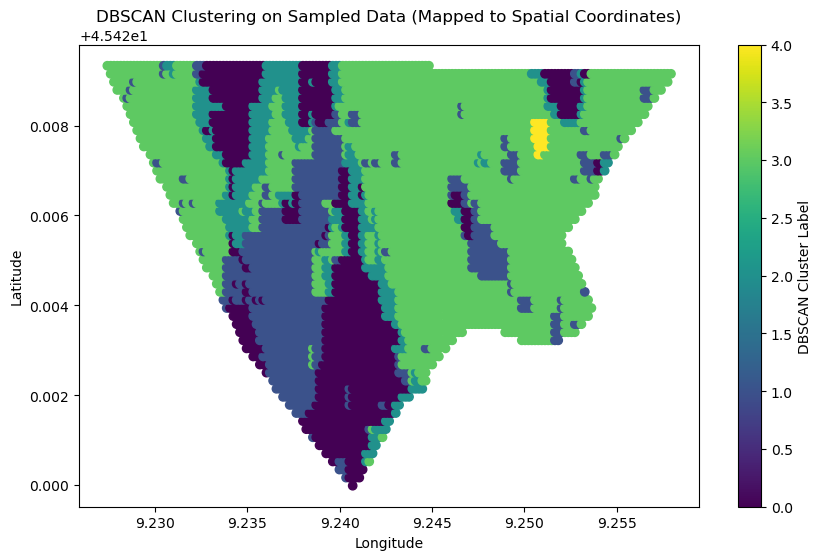

Number of DBSCAN clusters found: 5


In [81]:
# Plot the DBSCAN clusters mapped to latitude and longitude
plt.figure(figsize=(10, 6))
plt.scatter(zone4_sample['Longitude'], zone4_sample['Latitude'], c=zone4_sample['dbscan_cluster'], cmap='viridis', marker='o')
plt.title('DBSCAN Clustering on Sampled Data (Mapped to Spatial Coordinates)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='DBSCAN Cluster Label')
plt.show()

# Print the number of clusters found
num_dbscan_clusters = len(set(zone4_sample['dbscan_cluster'])) - (1 if -1 in zone4_sample['dbscan_cluster'] else 0)
print(f'Number of DBSCAN clusters found: {num_dbscan_clusters}')

In [18]:
from sklearn.cluster import KMeans

In [1]:
#K- Means
kmeans = KMeans(n_clusters=2, random_state=42)  # Adjust n_clusters as needed
zone4_sample['kmeans_cluster'] = kmeans.fit_predict(features4)

NameError: name 'KMeans' is not defined

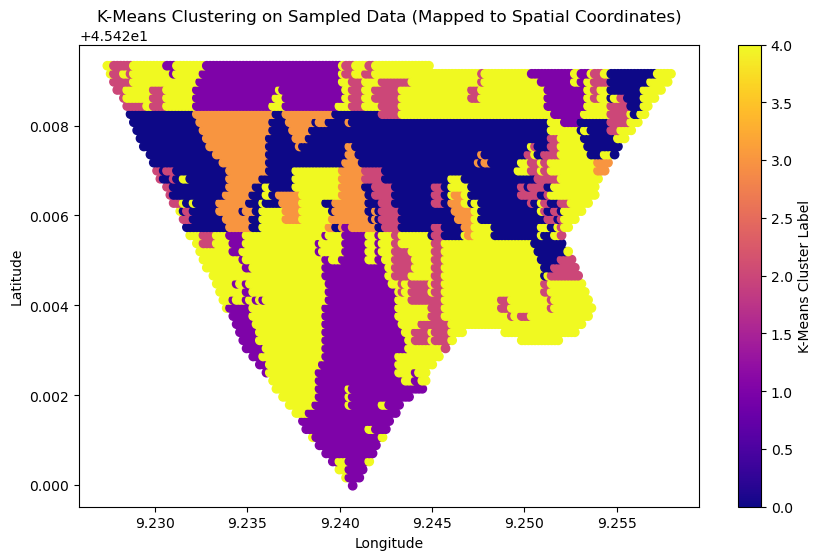

Number of K-Means clusters found: 5


In [83]:
# Plot the K-Means clusters mapped to latitude and longitude
plt.figure(figsize=(10, 6))
plt.scatter(zone4_sample['Longitude'], zone4_sample['Latitude'], c=zone4_sample['kmeans_cluster'], cmap='plasma', marker='o')
plt.title('K-Means Clustering on Sampled Data (Mapped to Spatial Coordinates)')
plt.xlabel('Longitude')
plt.ylabel('Latitude')
plt.colorbar(label='K-Means Cluster Label')
plt.show()

# Print the number of clusters found
num_kmeans_clusters = len(set(zone4_sample['kmeans_cluster']))
print(f'Number of K-Means clusters found: {num_kmeans_clusters}')

In [89]:
zone4_sample.info()

<class 'pandas.core.frame.DataFrame'>
Index: 5000 entries, 0 to 4999
Data columns (total 7 columns):
 #   Column                     Non-Null Count  Dtype  
---  ------                     --------------  -----  
 0   Longitude                  5000 non-null   float64
 1   Latitude                   5000 non-null   float64
 2   env_suitability_score      5000 non-null   float64
 3   amenity_suitability_score  5000 non-null   float64
 4   land_suitability_score     5000 non-null   int64  
 5   dbscan_cluster             5000 non-null   int64  
 6   kmeans_cluster             5000 non-null   int32  
dtypes: float64(4), int32(1), int64(2)
memory usage: 422.0 KB


In [41]:
import folium
from folium.plugins import MarkerCluster
from IPython.display import display
import seaborn as sns


In [98]:
(zone4_sample['dbscan_cluster'] == -1).sum()

0

In [102]:
# Verify cluster IDs and their counts
print("DBSCAN Cluster Counts:", zone4_sample['dbscan_cluster'].value_counts())
print("K-Means Cluster Counts:", zone4_sample['kmeans_cluster'].value_counts())

# Verify colors
print("DBSCAN Colors:", dbscan_colors)
print("K-Means Colors:", kmeans_colors)

DBSCAN Cluster Counts: dbscan_cluster
1    3608
0    1392
Name: count, dtype: int64
K-Means Cluster Counts: kmeans_cluster
0    3608
1    1392
Name: count, dtype: int64
DBSCAN Colors: [(0.190631, 0.407061, 0.556089), (0.20803, 0.718701, 0.472873)]
K-Means Colors: [(0.610667, 0.090204, 0.619951), (0.928329, 0.472975, 0.326067)]


In [106]:
# Define colors for clusters
dbscan_colors = sns.color_palette('viridis', len(set(zone4_sample['dbscan_cluster'])))
kmeans_colors = sns.color_palette('plasma', len(set(zone4_sample['kmeans_cluster'])))

# Print colors for debugging
print("DBSCAN Colors:", dbscan_colors)
print("K-Means Colors:", kmeans_colors)

DBSCAN Colors: [(0.190631, 0.407061, 0.556089), (0.20803, 0.718701, 0.472873)]
K-Means Colors: [(0.610667, 0.090204, 0.619951), (0.928329, 0.472975, 0.326067)]


In [108]:
import matplotlib.colors as mcolors
#Convert colors to hexadecimal format
dbscan_colors_hex = [mcolors.rgb2hex(color) for color in dbscan_colors]
kmeans_colors_hex = [mcolors.rgb2hex(color) for color in kmeans_colors]


In [109]:
#Print colors for debugging
print("DBSCAN Colors:", dbscan_colors_hex)
print("K-Means Colors:", kmeans_colors_hex)

DBSCAN Colors: ['#31688e', '#35b779']
K-Means Colors: ['#9c179e', '#ed7953']


In [110]:
#Function to add clusters to a folium map
def add_clusters_to_map(fmap, df, cluster_col, colors, cluster_type):
    cluster_id_to_color = {cluster_id: colors[idx % len(colors)] for idx, cluster_id in enumerate(set(df[cluster_col]))}
    print(f"{cluster_type} Cluster ID to Color Mapping:", cluster_id_to_color)  # Debug print
    for idx, row in df.iterrows():
        cluster_id = int(row[cluster_col])
        color = cluster_id_to_color[cluster_id]
        folium.CircleMarker(
            location=[row['Latitude'], row['Longitude']],
            radius=3,
            color=color,
            fill=True,
            fill_color=color,
            fill_opacity=0.6,
            popup=f"{cluster_type} Cluster: {cluster_id}"
        ).add_to(fmap)

# Initialize folium maps
map_dbscan = folium.Map(location=[zone4_sample['Latitude'].mean(), zone4_sample['Longitude'].mean()], zoom_start=13)
map_kmeans = folium.Map(location=[zone4_sample['Latitude'].mean(), zone4_sample['Longitude'].mean()], zoom_start=13)

# Add DBSCAN clusters to the map
add_clusters_to_map(map_dbscan, zone4_sample, 'dbscan_cluster', dbscan_colors_hex, 'DBSCAN')

# Add K-Means clusters to the map
add_clusters_to_map(map_kmeans, zone4_sample, 'kmeans_cluster', kmeans_colors_hex, 'K-Means')

# Display maps in Jupyter notebook
display(map_dbscan)
display(map_kmeans)

DBSCAN Cluster ID to Color Mapping: {0: '#31688e', 1: '#35b779'}
K-Means Cluster ID to Color Mapping: {0: '#9c179e', 1: '#ed7953'}


K-means with k=2 is similar to DBSCAN with epsilom 0.4 and min samples 4, which produces 2 clusters. When mapping to the lat and lon it does appear that one cluster is forming in areas that may be suitable for Urban Agriculutre, excluding parks. Since K-means produces results similar to DBSCAN and is more computationally efficient K-means will be used moving forward on each zone. 

### K-Means

**Zone 4**

In [19]:
zone4 = zone_4[['Longitude','Latitude','env_suitability_score', 
                              'amenity_suitability_score', 'land_suitability_score']]

In [27]:
def plot_static_map(df):
    # Define colors for each cluster
    cluster_colors = {
        0: 'blue',
        1: 'orange',
    }

    # Create a scatter plot
    plt.figure(figsize=(15, 15))
    for cluster in df['kmeans_cluster'].unique():
        subset = df[df['kmeans_cluster'] == cluster]
        plt.scatter(subset['Longitude'], subset['Latitude'], 
                    c=cluster_colors.get(cluster, 'black'), 
                    label=f'Cluster {cluster}', 
                    alpha=0.5, s=1)

    plt.xlabel('Longitude')
    plt.ylabel('Latitude')
    plt.title('Clusters in Zone 4')
    plt.legend()
    plt.show()

In [34]:
kmeans = KMeans(n_clusters=2, random_state=0).fit(zone4[['env_suitability_score', 'amenity_suitability_score', 'land_suitability_score']])
zone4['kmeans_cluster'] = kmeans.labels_

/Users/kamiasalango/anaconda3/envs/capstone_wavepower/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/h5/pnqm5hvd2vj1397_ck_gmtj00000gn/T/ipykernel_58212/1911236171.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone4['kmeans_cluster'] = kmeans.labels_


In [52]:
zone4['kmeans_cluster'].value_counts()

kmeans_cluster
0    770167
1     98742
Name: count, dtype: int64

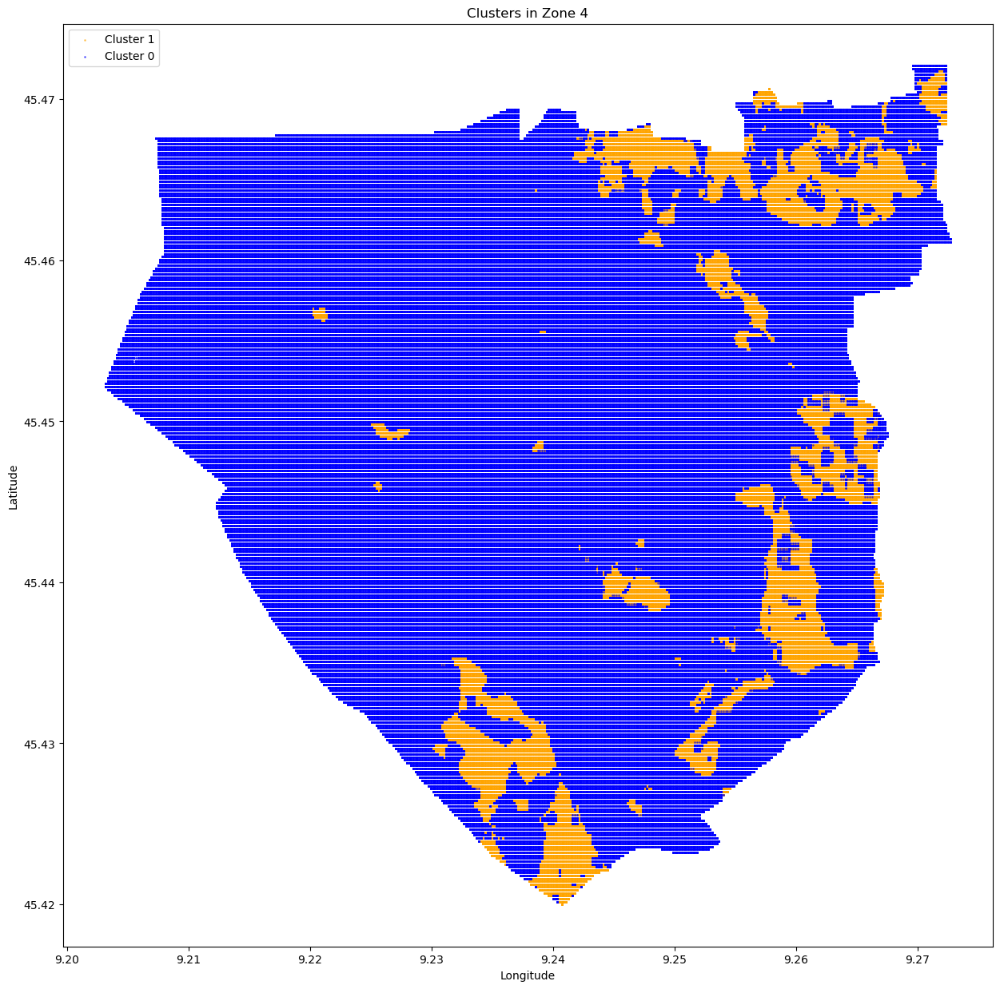

In [35]:
plot_static_map(zone4)

In [37]:
cluster_1_df = zone4[zone4['kmeans_cluster'] == 1]

In [38]:
#function to create and display the map with the filtered data
def create_folium_map(df, map_title='Map'):
    # Initialize the map centered around the average coordinates of the filtered data
    m = folium.Map(location=[df['Latitude'].mean(), df['Longitude'].mean()], zoom_start=12)

    # Create a marker cluster
    marker_cluster = MarkerCluster().add_to(m)

    # Add points to the cluster
    for idx, row in df.iterrows():
        folium.Marker(
            location=[row['Latitude'], row['Longitude']],
            popup=f'Cluster: {row["kmeans_cluster"]}',
            icon=folium.Icon(color='blue')
        ).add_to(marker_cluster)

    # Display the map
    display(m)

In [ ]:
create_folium_map(cluster_1_df, 'KMeans Suitable Clusters')

**Zone 9**

In [51]:
zone9 = zone_9[['Longitude','Latitude','env_suitability_score', 
                              'amenity_suitability_score', 'land_suitability_score']]

In [53]:
#kmeans zone 9
kmeans = KMeans(n_clusters=2, random_state=0).fit(zone9[['env_suitability_score', 'amenity_suitability_score', 'land_suitability_score']])
zone9['kmeans_cluster'] = kmeans.labels_

/Users/kamiasalango/anaconda3/envs/capstone_wavepower/lib/python3.8/site-packages/sklearn/cluster/_kmeans.py:1412: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)
/var/folders/h5/pnqm5hvd2vj1397_ck_gmtj00000gn/T/ipykernel_58212/3992496306.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone9['kmeans_cluster'] = kmeans.labels_


In [54]:
zone9['kmeans_cluster'].value_counts()

kmeans_cluster
0    788493
1     81817
Name: count, dtype: int64

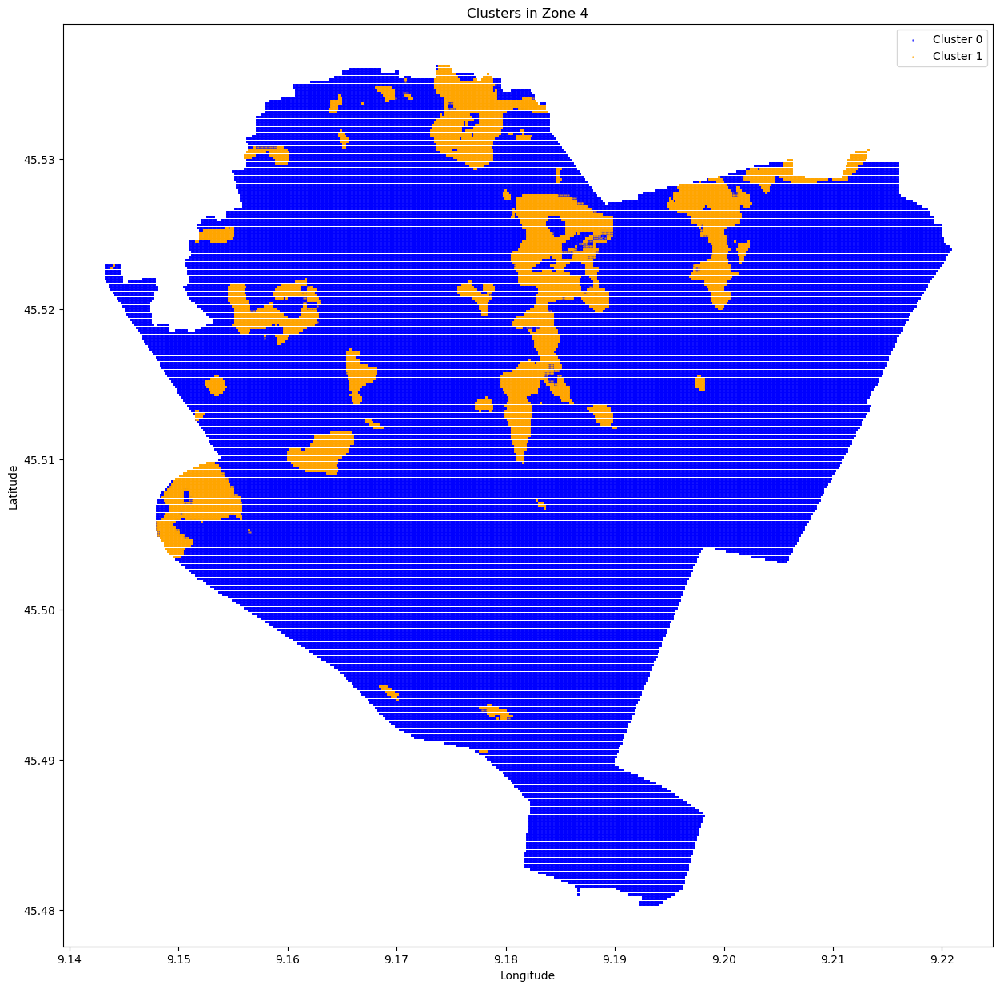

In [56]:
plot_static_map(zone9)

In [57]:
#filter df for kmeans cluster =1 --> suitable for agriculture
cluster_1_zone9 = zone9[zone9['kmeans_cluster'] == 1]

In [ ]:
create_folium_map(cluster_1_zone9, 'KMeans Suitable Clusters')